# GUC Clustering Project 

**Objective:** 
The objective of this project teach students how to apply clustering to real data sets

The projects aims to teach student: 
* Which clustering approach to use
* Compare between Kmeans, Hierarchal, DBScan, and Gaussian Mixtures  
* How to tune the parameters of each data approach
* What is the effect of different distance functions (optional) 
* How to evaluate clustering approachs 
* How to display the output
* What is the effect of normalizing the data 

Students in this project will use ready-made functions from Sklearn, plotnine, numpy and pandas 
 



In [664]:
# if plotnine is not installed in Jupter then use the following command to install it 
!pip install plotnine

Running this project require the following imports 

In [665]:
import warnings
warnings.filterwarnings('ignore')
import seaborn as sns 
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import sklearn.preprocessing as prep
from sklearn.datasets import make_blobs
from plotnine import *   
# StandardScaler is a function to normalize the data 
# You may also check MinMaxScaler and MaxAbsScaler 
#from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import NearestNeighbors

from sklearn.cluster import DBSCAN


from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture

from sklearn.metrics import silhouette_score

%matplotlib inline

from scipy.spatial.distance import cdist
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn import metrics
from matplotlib.patches import Ellipse
from sklearn import mixture 
from scipy.stats import multivariate_normal




In [666]:
# helper function that allows us to display data in 2 dimensions an highlights the clusters
def display_cluster(X,km=[],num_clusters=0):
    color = 'brgcmyk'  #List colors
    alpha = 0.5  #color obaque
    s = 20
    if num_clusters == 0:
        plt.scatter(X[:,0],X[:,1],c = color[0],alpha = alpha,s = s)
    else:
        for i in range(num_clusters):
            plt.scatter(X[km.labels_==i,0],X[km.labels_==i,1],c = color[i],alpha = alpha,s=s)
            plt.scatter(km.cluster_centers_[i][0],km.cluster_centers_[i][1],c = color[i], marker = 'x', s = 100)

In [667]:
#kmeans helper method
def kmeans_help(X):
    distortions = []
    scores = []
    K = range(2, 10)
    v=0
    for k in K:
        # Building and fitting the model
        kmeanModel = KMeans(n_clusters=k)
        kmeanModel.fit_predict(X)
        
        plt.scatter(X[:,0],X[:,1],c=kmeanModel.labels_,cmap='rainbow',s=20)
        plt.scatter(kmeanModel.cluster_centers_[:,0],kmeanModel.cluster_centers_[:,1],color='black',marker='X',s=70)
        plt.title('K= %i'%k)
        plt.show()
        
        distortions.append(sum(np.min(cdist(X, kmeanModel.cluster_centers_,'euclidean'), axis=1)) / X.shape[0])
        scores.append(silhouette_score(X,kmeanModel.labels_,metric='euclidean'))
        print("K value= ",k)
        print("Silhouette score: ",scores[v])
        v=v+1
               
    plt.plot(K, distortions, 'bx-')
    plt.xlabel('Values of K')
    plt.ylabel('Distortion')
    plt.title('The Elbow Method using Distortion')
    plt.show()
    
    plt.plot(K, scores, 'bx-')
    plt.xlabel('Values of K')
    plt.ylabel('Silhouette score')
    plt.title('Silhouette score')
    plt.show()
    
    bestScore=np.argmax(scores)+2
    print("Best K value using Silhouette score : ", bestScore)
    

In [668]:
#Hierarchal clustering helper method
def Hierarchal_clustering(X):
    scores = []
    aff=["euclidean","manhattan","cosine"]
    link=["average", "single"]
    dist=range(1,4)
    v=0
    for l in link:
        for a in aff:
            for d in dist:
                hicluster=AgglomerativeClustering(n_clusters=None, affinity=a, linkage=l, distance_threshold=d)  
                hicluster.fit_predict(X)
                plt.figure(figsize=(10, 7))
                plt.title("Affinty: {a}/Linkage: {l}/Threshold Distance: {d}".format(a=a,l=l,d=d))
                plt.scatter(X[:,0],X[:,1],c=hicluster.labels_,s=20)
                if(np.amax(hicluster.labels_<2)):
                    print("can't apply Silhouette Score , number of clusters is less than 2")
                else:
                    scores.append(silhouette_score(X,hicluster.labels_,metric='euclidean'))
                    print("Silhouette score: ",scores[v])
                    v=v+1
            plt.figure(figsize=(10, 7))
            plot_dendrogram(hicluster,truncate_mode="lastp", p=6)
        
                           

            


In [669]:
def plot_dendrogram(model, **kwargs):
    # Create linkage matrix and then plot the dendrogram

    # create the counts of samples under each node
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1  # leaf node
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    linkage_matrix = np.column_stack([model.children_, model.distances_, counts]).astype(float)

    # Plot the corresponding dendrogram
    dendrogram(linkage_matrix, **kwargs)

In [670]:
#DBscan helper method
def Dbscanhelp(X):
    best =[0,0,0,0]
    Min_Samples = range(5,26)
    score=0
    for m in Min_Samples:
        for eps in [i/10 for i in range(1,31)]:
            print("EPS: {eps}".format(eps=eps))
            print("Min Samples: {m}".format(m=m))
            dbcluster = DBSCAN(eps = eps, min_samples = m).fit(X)
            nclusters = len(np.unique(dbcluster.labels_) )
            if(nclusters<2):
                print("Can't apply Silhouette Score , number of clusters is less than 2")
            else:
                score = metrics.silhouette_score(X,dbcluster.labels_)
                print('Silhouette Score: {score}'.format(score=score))
            if score > best[3]:
                best=(eps,m, nclusters, score)
    print("---------------------------------------------------------")
    print("EPS={e}".format(e=best[0])) 
    print("Min Sample: ",best[1])
    print("Number of clusters: ", best[2])
    print("Average Silhouette Score: " , best[3])
    print("---------------------------------------------------------")
    bestcluster=DBSCAN(eps=2.1,min_samples=6).fit(X)
    plt.figure(figsize=(10, 7))
    plt.scatter(X[:,0], X[:,1], c=bestcluster.labels_,cmap='rainbow',s=20)



            

        

    


In [671]:
#Gaussian Mixture herlper method
#def gmhelp(X):
 #   cov_types=["full","tied","diag","spherical"]
  #  for c in cov_types:
   #     gmmmodel =mixture.GaussianMixture(n_components=4, covariance_type=c)
    #    labels = gmmmodel.fit_predict(X)
     #   plot_gmm(gmmmodel,X)
    

In [672]:
def draw_ellipse(position, covariance, ax=None, **kwargs):
    """Draw an ellipse with a given position and covariance"""
    ax = ax or plt.gca()
    
    # Convert covariance to principal axes
    if covariance.shape == (2, 2):
        U, s, Vt = np.linalg.svd(covariance)
        angle = np.degrees(np.arctan2(U[1, 0], U[0, 0]))
        width, height = 2 * np.sqrt(s)
    else:
        angle = 0
        height = 2 * np.sqrt(covariance)
        width= 2 * np.sqrt(covariance)
    # Draw the Ellipse
    for nsig in range(1, 4):
        ax.add_patch(Ellipse(position, nsig * width, nsig * height,
                             angle, **kwargs))
        
def plot_gmm(gmm, X, label=True, ax=None):
    ax = ax or plt.gca()
    labels = gmm.fit(X).predict(X)
    if label:
        ax.scatter(X[:, 0], X[:, 1], c=labels, s=40, cmap='viridis', zorder=2)
    else:
        ax.scatter(X[:, 0], X[:, 1], s=40, zorder=2)
    ax.axis('equal')
    
    w_factor = 0.2 / gmm.weights_.max()
    for pos, covar, w in zip(gmm.means_, gmm.covariances_, gmm.weights_):
        draw_ellipse(pos, covar, alpha=w * w_factor)
        
def plot_contours(data, means, covs, title):
    """visualize the gaussian components over the data"""
    plt.figure()
    plt.plot(data[:, 0], data[:, 1], 'ko')

    delta = 0.025
    k = means.shape[0]
    x = np.arange(-2.0, 7.0, delta)
    y = np.arange(-2.0, 7.0, delta)
    x_grid, y_grid = np.meshgrid(x, y)
    coordinates = np.array([x_grid.ravel(), y_grid.ravel()]).T

    col = ['green', 'red', 'indigo']
    for i in range(k):
        mean = means[i]
        cov = covs[i]
        z_grid = multivariate_normal(mean, cov).pdf(coordinates).reshape(x_grid.shape)
        plt.contour(x_grid, y_grid, z_grid, colors = col[i])

    plt.title(title)
    plt.tight_layout()

## Multi Blob Data Set 
* The Data Set generated below has 6 cluster with varying number of users and varing densities
* Cluster the data set below using 



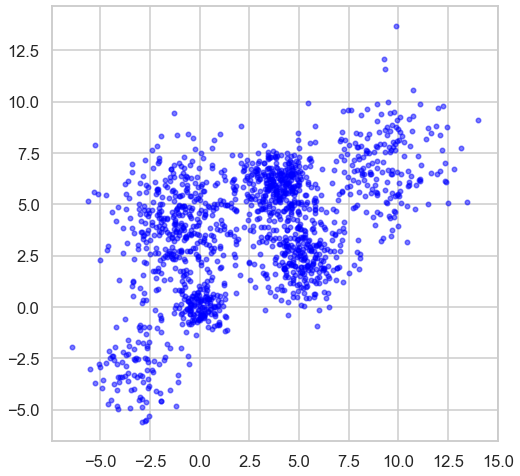

In [673]:
plt.rcParams['figure.figsize'] = [8,8]
sns.set_style("whitegrid")
sns.set_context("talk")

n_bins = 6  
centers = [(-3, -3), (0, 0), (5,2.5),(-1, 4), (4, 6), (9,7)]
Multi_blob_Data, y = make_blobs(n_samples=[100,150, 300, 400,300, 200], n_features=2, cluster_std=[1.3,0.6, 1.2, 1.7,0.9,1.7],
                  centers=centers, shuffle=False, random_state=42)
display_cluster(Multi_blob_Data)

### Kmeans 
* Use Kmeans with different values of K to cluster the above data 
* Display the outcome of each value of K 
* Plot distortion function versus K and choose the approriate value of k 
* Plot the silhouette_score versus K and use it to choose the best K 
* Store the silhouette_score for the best K for later comparison with other clustering techniques. 

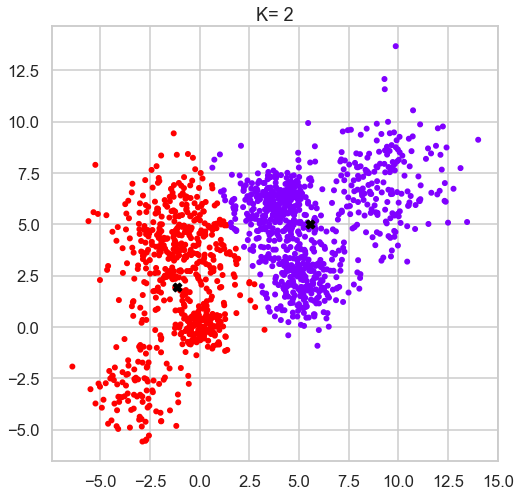

K value=  2
Silhouette score:  0.4751544541991239


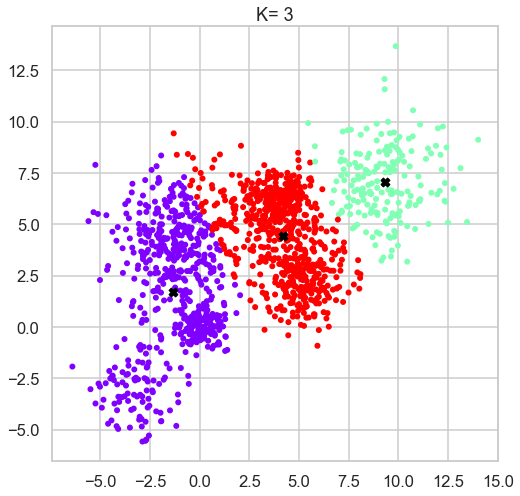

K value=  3
Silhouette score:  0.43631793714185435


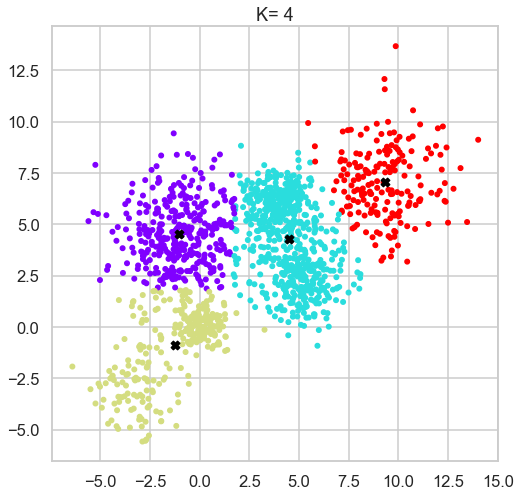

K value=  4
Silhouette score:  0.4628725400351352


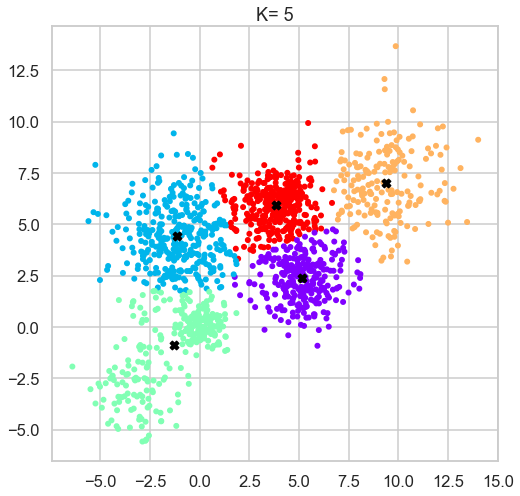

K value=  5
Silhouette score:  0.48100602217073096


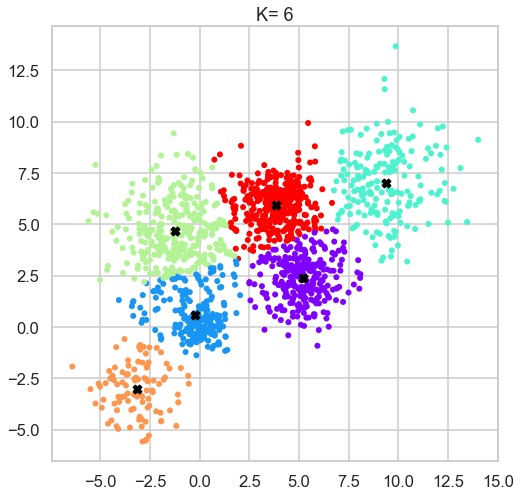

K value=  6
Silhouette score:  0.4859737366910219


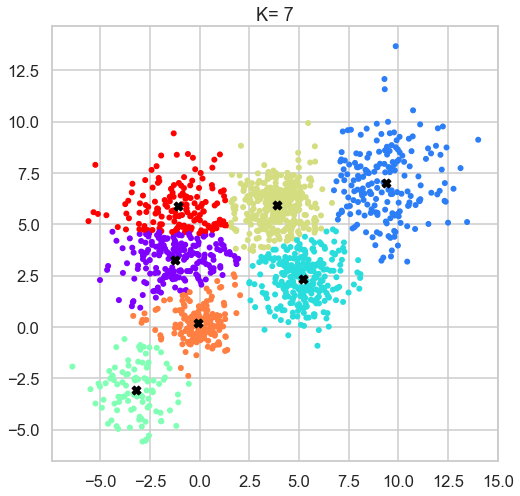

K value=  7
Silhouette score:  0.4627303708652275


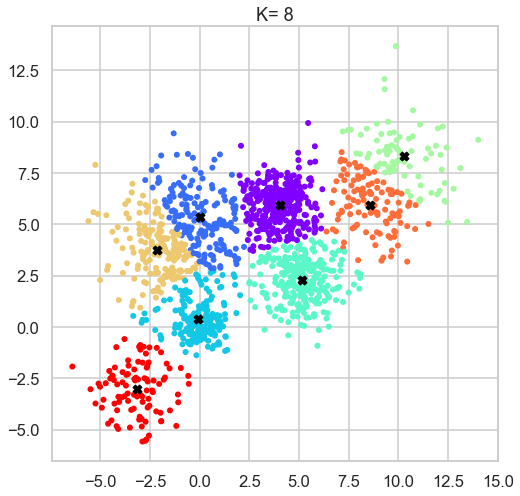

K value=  8
Silhouette score:  0.44342826922624695


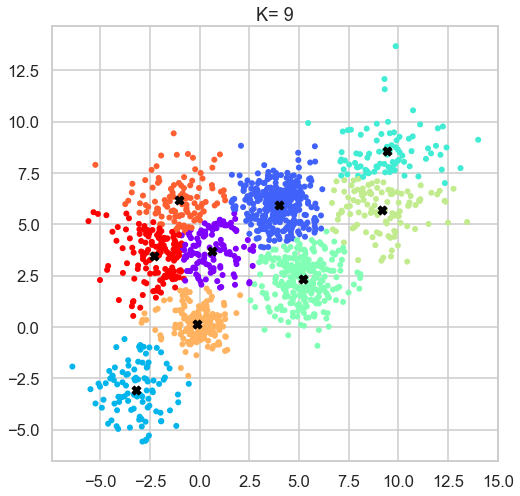

K value=  9
Silhouette score:  0.4524794662877201


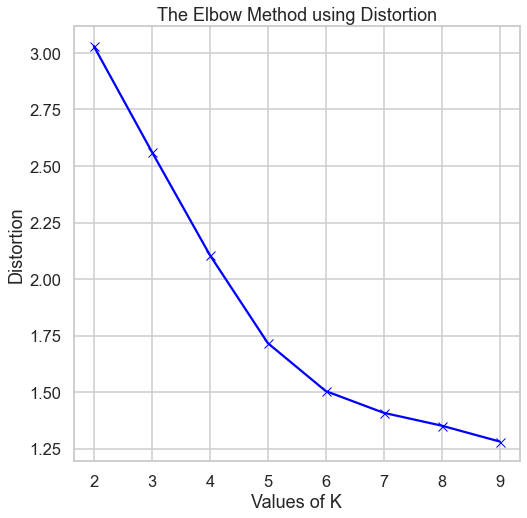

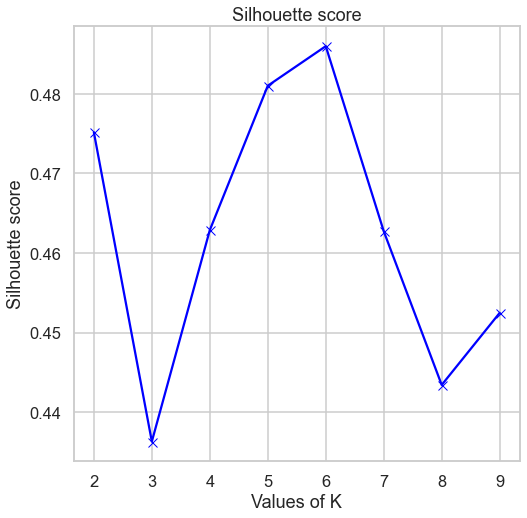

Best K value using Silhouette score :  6


In [674]:
kmeans_help(Multi_blob_Data)

In [675]:
kmeanscore=0.4862794240733028

### Hierarchal Clustering
* Use AgglomerativeClustering function to  to cluster the above data 
* In the  AgglomerativeClustering change the following parameters 
    * Affinity (use euclidean, manhattan and cosine)
    * Linkage( use average and single )
    * Distance_threshold (try different)
* For each of these trials plot the Dendograph , calculate the silhouette_score and display the resulting clusters  
* Find the set of paramters that would find result in the best silhouette_score and store this score for later comparison with other clustering techniques. 
* Record your observation 

can't apply Silhouette Score , number of clusters is less than 2
can't apply Silhouette Score , number of clusters is less than 2
can't apply Silhouette Score , number of clusters is less than 2
can't apply Silhouette Score , number of clusters is less than 2
can't apply Silhouette Score , number of clusters is less than 2
can't apply Silhouette Score , number of clusters is less than 2
can't apply Silhouette Score , number of clusters is less than 2
can't apply Silhouette Score , number of clusters is less than 2
can't apply Silhouette Score , number of clusters is less than 2
can't apply Silhouette Score , number of clusters is less than 2
can't apply Silhouette Score , number of clusters is less than 2
can't apply Silhouette Score , number of clusters is less than 2
can't apply Silhouette Score , number of clusters is less than 2
can't apply Silhouette Score , number of clusters is less than 2
can't apply Silhouette Score , number of clusters is less than 2
can't apply Silhouette Sc

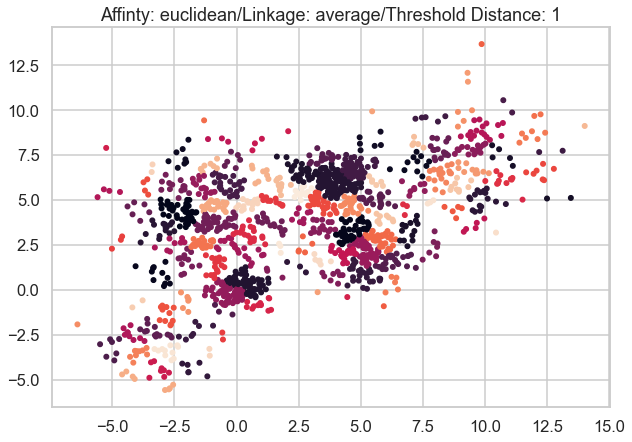

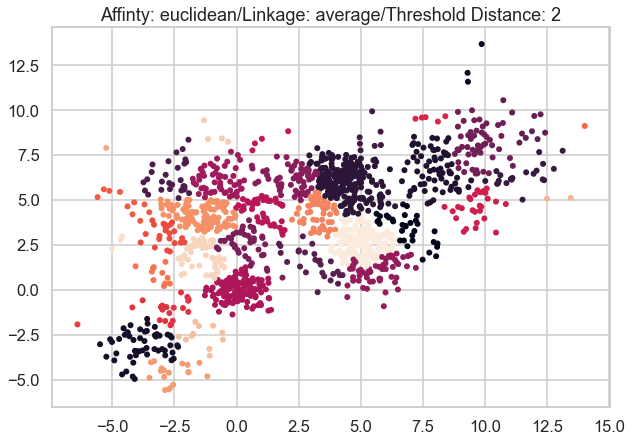

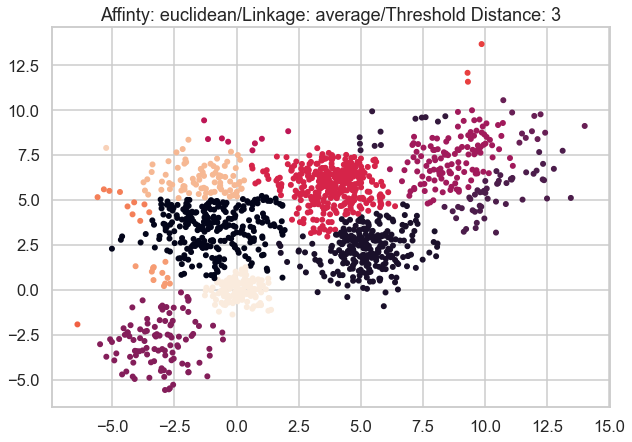

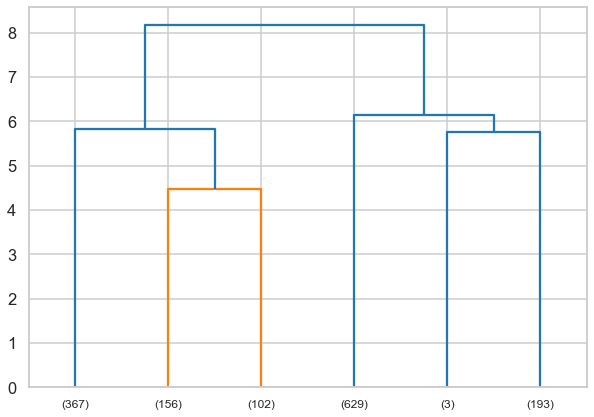

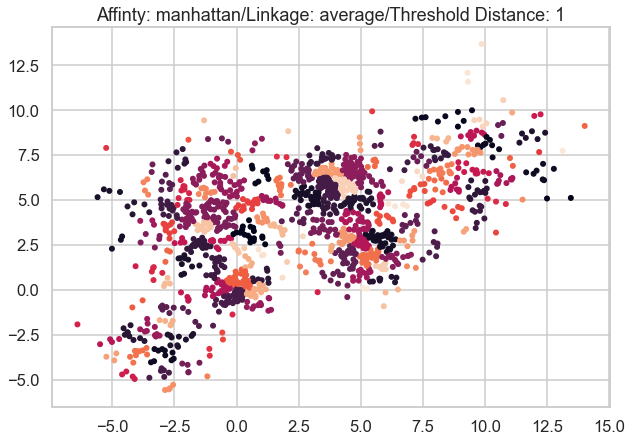

...

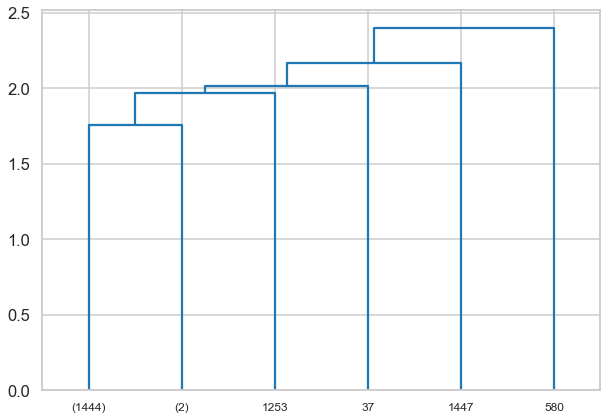

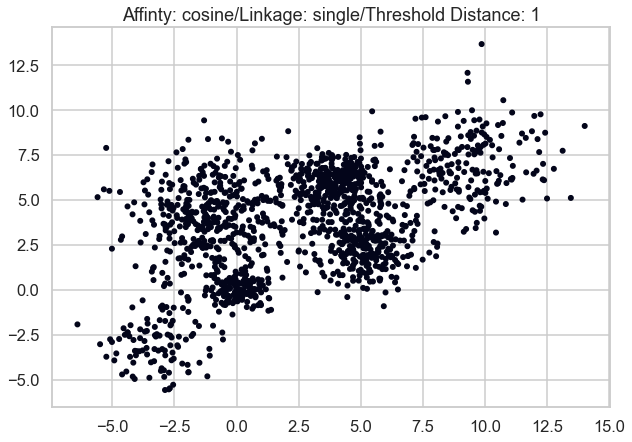

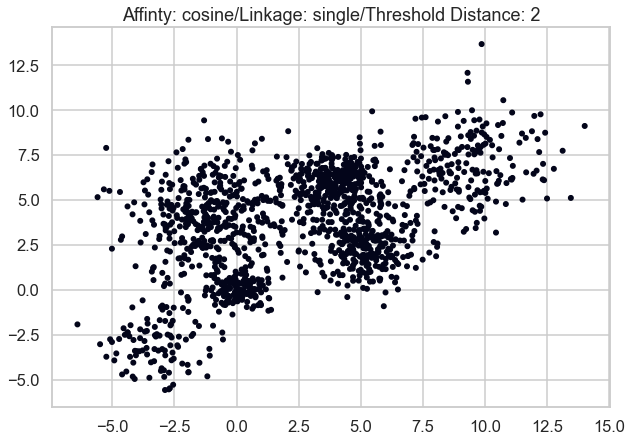

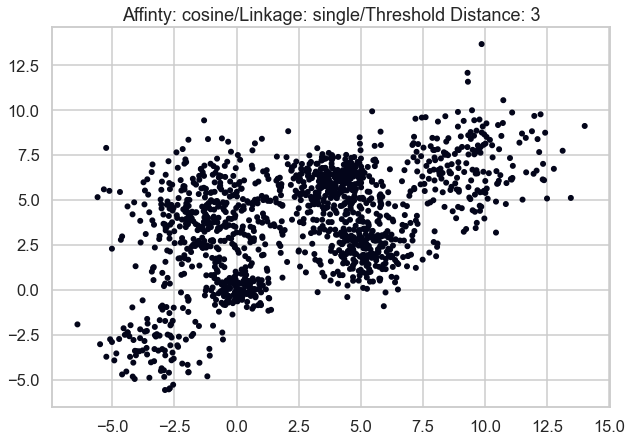

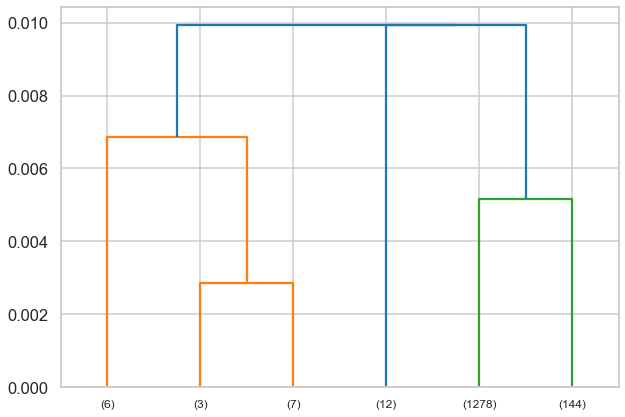

In [676]:
Hierarchal_clustering(Multi_blob_Data)

### DBScan
* Use DBScan function to  to cluster the above data 
* In the  DBscan change the following parameters 
    * EPS (from 0.1 to 3)
    * Min_samples (from 5 to 25)
* Plot the silhouette_score versus the variation in the EPS and the min_samples
* Plot the resulting Clusters in this case 
* Find the set of paramters that would find result in the best silhouette_score and store this score for later comparison with other clustering techniques. 
* Record your observations and comments 

EPS: 0.1
Min Samples: 5
Silhouette Score: -0.5423348432605972
EPS: 0.2
Min Samples: 5
Silhouette Score: -0.3999643249301035
EPS: 0.3
Min Samples: 5
Silhouette Score: -0.13789448202067064
EPS: 0.4
Min Samples: 5
Silhouette Score: -0.036215514032276665
EPS: 0.5
Min Samples: 5
Silhouette Score: -0.07318209741938357
EPS: 0.6
Min Samples: 5
Silhouette Score: -0.24039252244607714
EPS: 0.7
Min Samples: 5
Silhouette Score: 0.22952137161333858
EPS: 0.8
Min Samples: 5
Silhouette Score: 0.2452610579674417
EPS: 0.9
Min Samples: 5
Silhouette Score: 0.3907788734374356
EPS: 1.0
Min Samples: 5
Silhouette Score: 0.38592246951059755
EPS: 1.1
Min Samples: 5
Silhouette Score: 0.39636930805804305
EPS: 1.2
Min Samples: 5
Silhouette Score: 0.4531919763890837
EPS: 1.3
Min Samples: 5
Silhouette Score: 0.4531919763890837
EPS: 1.4
Min Samples: 5
Silhouette Score: 0.4531919763890837
EPS: 1.5
Min Samples: 5
Silhouette Score: 0.43621424543357235
EPS: 1.6
Min Samples: 5
Silhouette Score: 0.44948549198650606
EPS: 1.7

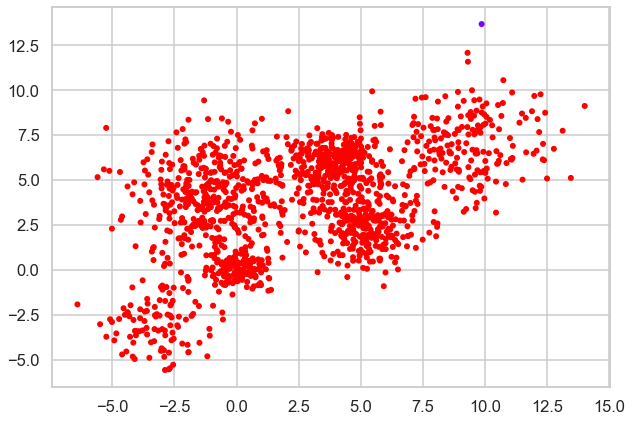

In [677]:
Dbscanhelp(Multi_blob_Data)

### Gaussian Mixture
* Use GaussianMixture function to cluster the above data 
* In GMM change the covariance_type and check the difference in the resulting proabability fit 
* Use a 2D contour plot to plot the resulting distribution (the components of the GMM) as well as the total Gaussian mixture 

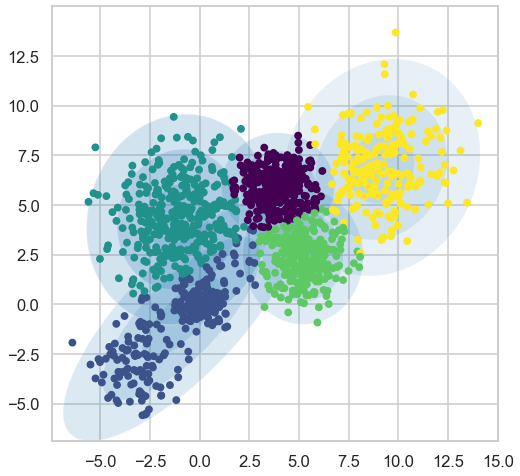

In [678]:
gmm1 =mixture.GaussianMixture(n_components=5, covariance_type='full', random_state=42)
labels = gmm1.fit_predict(Multi_blob_Data)
plot_gmm(gmm1,Multi_blob_Data)

ValueError: setting an array element with a sequence.

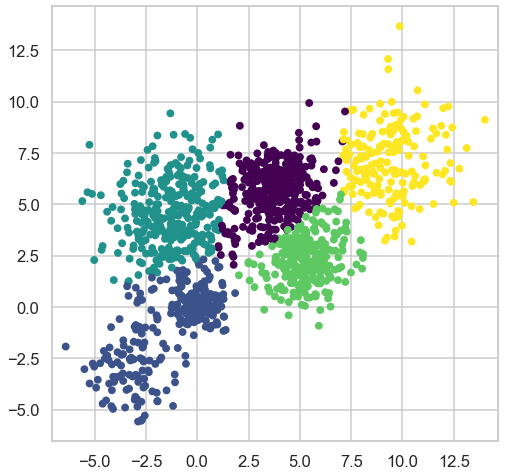

In [679]:
gmm2 =mixture.GaussianMixture(n_components=5, covariance_type='tied', random_state=42)
labels = gmm2.fit_predict(Multi_blob_Data)
plot_gmm(gmm2,Multi_blob_Data)

ValueError: setting an array element with a sequence.

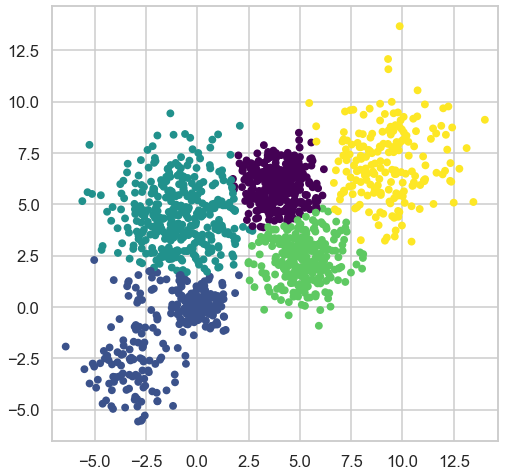

In [680]:
gmm3 =mixture.GaussianMixture(n_components=5, covariance_type='diag', random_state=42)
labels = gmm3.fit_predict(Multi_blob_Data)
plot_gmm(gmm3,Multi_blob_Data)

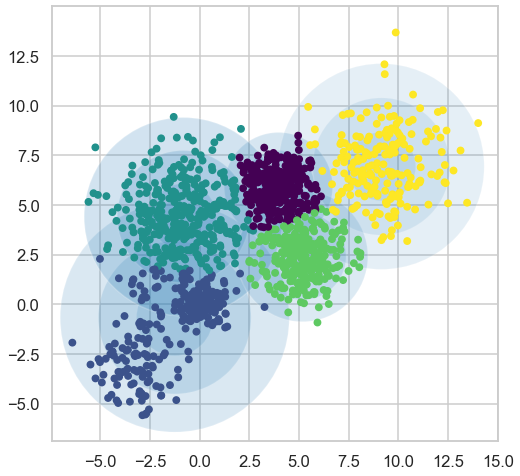

In [681]:
gmm4 =mixture.GaussianMixture(n_components=5, covariance_type='spherical', random_state=42)
labels = gmm4.fit_predict(Multi_blob_Data)
plot_gmm(gmm4,Multi_blob_Data)

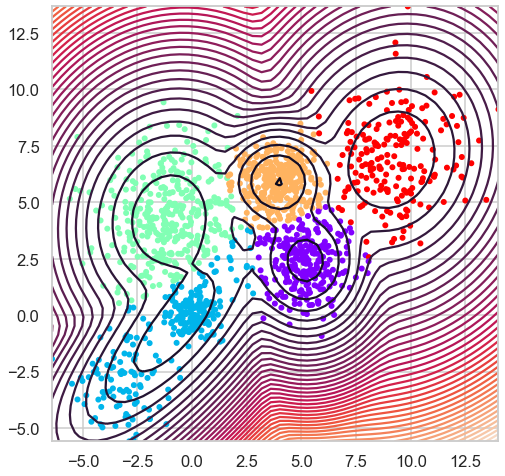

silhouette Score=0.46390142391784445


In [682]:
gmm=mixture.GaussianMixture(n_components=5, covariance_type='full')
gmm.fit(Multi_blob_Data)
Cluster=gmm.fit_predict(Multi_blob_Data)
x_min=(min(Multi_blob_Data[:, 0]))
x_max=(max(Multi_blob_Data[:, 0]))
y_min=(min(Multi_blob_Data[:, 1]))
y_max=(max(Multi_blob_Data[:, 1]))
X,Y=np.meshgrid(np.linspace(x_min,x_max),np.linspace(y_min,y_max))
XX=np.array([X.ravel(),Y.ravel()]).T
Z=-gmm.score_samples(XX)
Z=Z.reshape((50,50))
plt.contour(X,Y,Z,levels=50)
plt.scatter(Multi_blob_Data[:,0],Multi_blob_Data[:,1], c=Cluster, s=20, cmap='rainbow')
plt.show()
print("silhouette Score={}".format(silhouette_score(Multi_blob_Data,Cluster)))

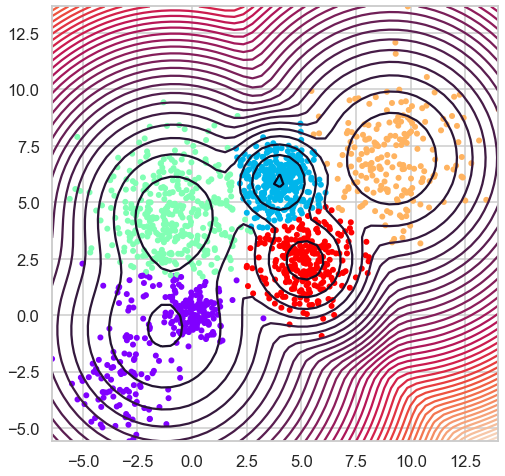

silhouette Score=0.47124061048119686


In [683]:
gmm=mixture.GaussianMixture(n_components=5, covariance_type='spherical')
gmm.fit(Multi_blob_Data)
Cluster=gmm.fit_predict(Multi_blob_Data)
x_min=(min(Multi_blob_Data[:, 0]))
x_max=(max(Multi_blob_Data[:, 0]))
y_min=(min(Multi_blob_Data[:, 1]))
y_max=(max(Multi_blob_Data[:, 1]))
X,Y=np.meshgrid(np.linspace(x_min,x_max),np.linspace(y_min,y_max))
XX=np.array([X.ravel(),Y.ravel()]).T
Z=-gmm.score_samples(XX)
Z=Z.reshape((50,50))
plt.contour(X,Y,Z,levels=50)
plt.scatter(Multi_blob_Data[:,0],Multi_blob_Data[:,1], c=Cluster, s=20, cmap='rainbow')
plt.show()
print("silhouette Score={}".format(silhouette_score(Multi_blob_Data,Cluster)))

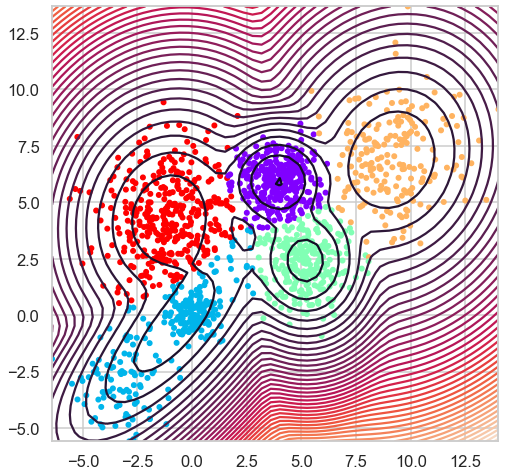

silhouette Score=0.46390142391784445


In [684]:
gmm=mixture.GaussianMixture(n_components=5, covariance_type='full')
gmm.fit(Multi_blob_Data)
Cluster=gmm.fit_predict(Multi_blob_Data)
x_min=(min(Multi_blob_Data[:, 0]))
x_max=(max(Multi_blob_Data[:, 0]))
y_min=(min(Multi_blob_Data[:, 1]))
y_max=(max(Multi_blob_Data[:, 1]))
X,Y=np.meshgrid(np.linspace(x_min,x_max),np.linspace(y_min,y_max))
XX=np.array([X.ravel(),Y.ravel()]).T
Z=-gmm.score_samples(XX)
Z=Z.reshape((50,50))
plt.contour(X,Y,Z,levels=50)
plt.scatter(Multi_blob_Data[:,0],Multi_blob_Data[:,1], c=Cluster, s=20, cmap='rainbow')
plt.show()
print("silhouette Score={}".format(silhouette_score(Multi_blob_Data,Cluster)))

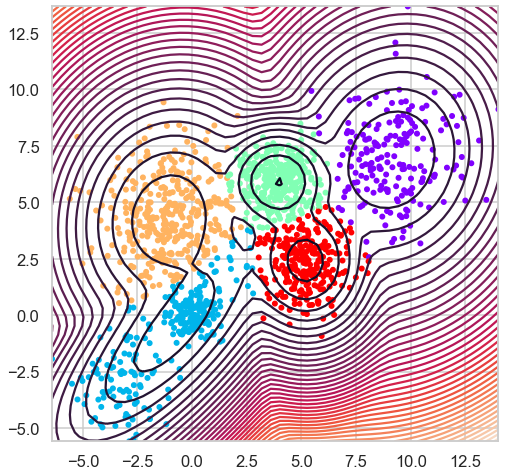

silhouette Score=0.46390142391784445


In [685]:
gmm=mixture.GaussianMixture(n_components=5, covariance_type='full')
gmm.fit(Multi_blob_Data)
Cluster=gmm.fit_predict(Multi_blob_Data)
x_min=(min(Multi_blob_Data[:, 0]))
x_max=(max(Multi_blob_Data[:, 0]))
y_min=(min(Multi_blob_Data[:, 1]))
y_max=(max(Multi_blob_Data[:, 1]))
X,Y=np.meshgrid(np.linspace(x_min,x_max),np.linspace(y_min,y_max))
XX=np.array([X.ravel(),Y.ravel()]).T
Z=-gmm.score_samples(XX)
Z=Z.reshape((50,50))
plt.contour(X,Y,Z,levels=50)
plt.scatter(Multi_blob_Data[:,0],Multi_blob_Data[:,1], c=Cluster, s=20, cmap='rainbow')
plt.show()
print("silhouette Score={}".format(silhouette_score(Multi_blob_Data,Cluster)))

## iris data set 
The iris data set is test data set that is part of the Sklearn module 
which contains 150 records each with 4 features. All the features are represented by real numbers 

The data represents three classes 


In [686]:
from sklearn.datasets import load_iris
iris_data = load_iris()
iris_data.target[[10, 25, 50]]
#array([0, 0, 1])
list(iris_data.target_names)
['setosa', 'versicolor', 'virginica']


['setosa', 'versicolor', 'virginica']

* Repeat all the above clustering approaches and steps on the above data 
* Normalize the data then repeat all the above steps 
* Compare between the different clustering approaches 

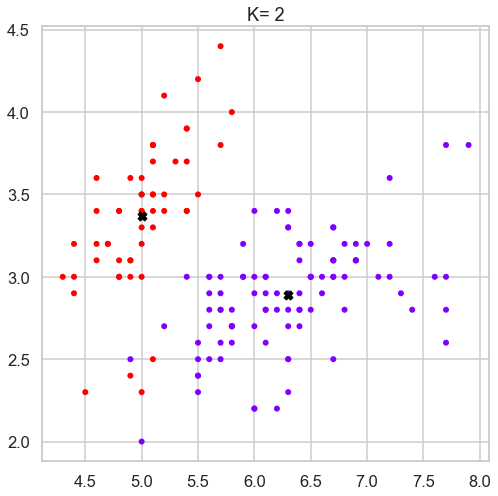

K value=  2
Silhouette score:  0.681046169211746


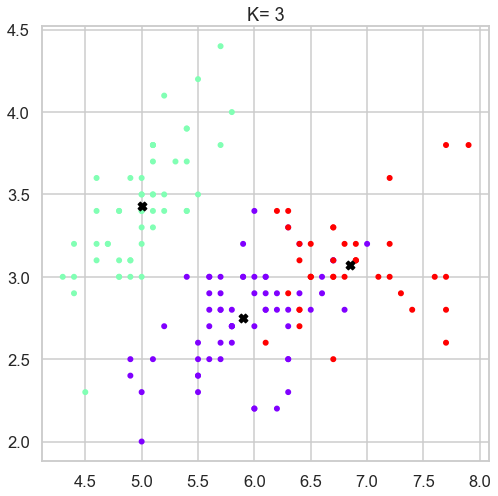

K value=  3
Silhouette score:  0.5528190123564091


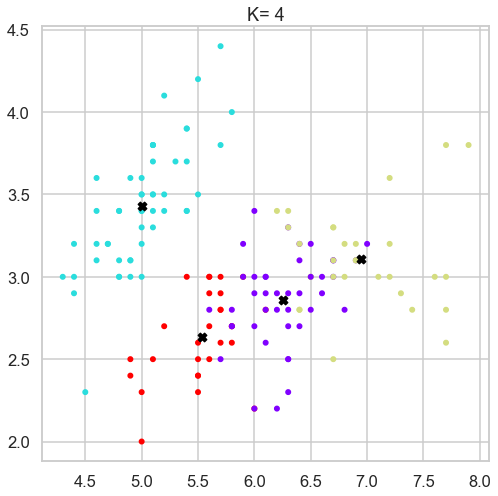

K value=  4
Silhouette score:  0.49721766487109686


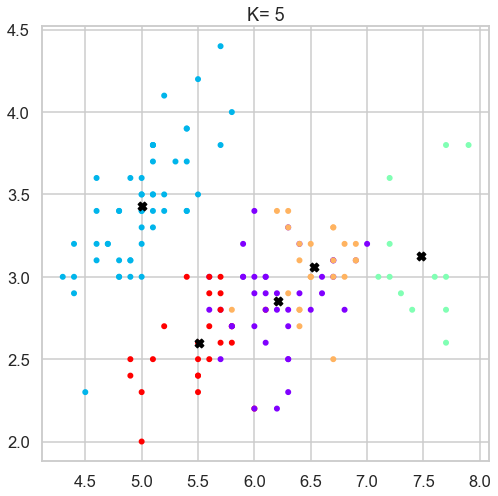

K value=  5
Silhouette score:  0.4887488870931048


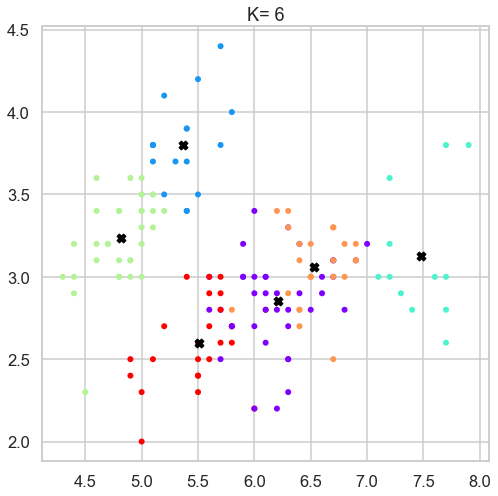

K value=  6
Silhouette score:  0.3599431166074392


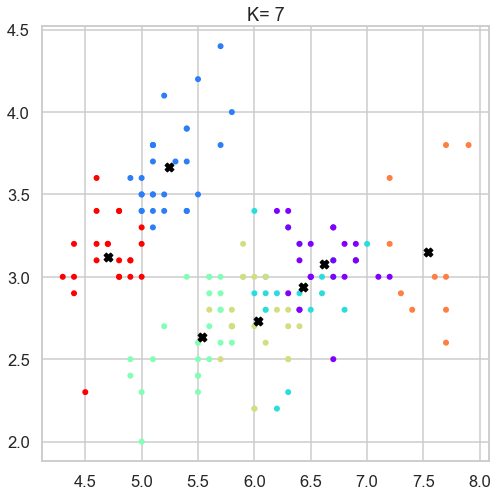

K value=  7
Silhouette score:  0.35439644785886376


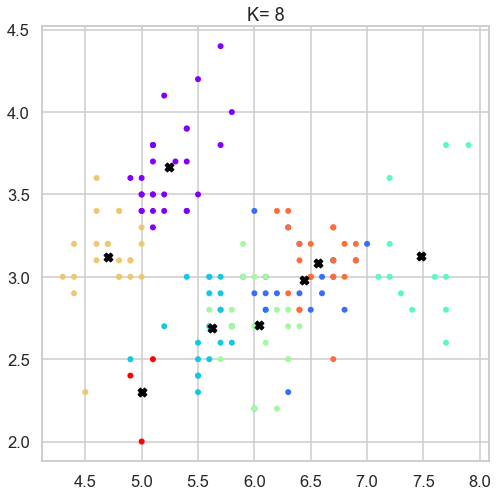

K value=  8
Silhouette score:  0.36179003359737993


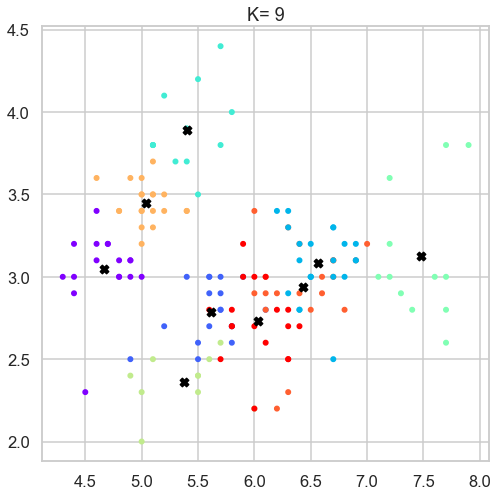

K value=  9
Silhouette score:  0.3114849890210245


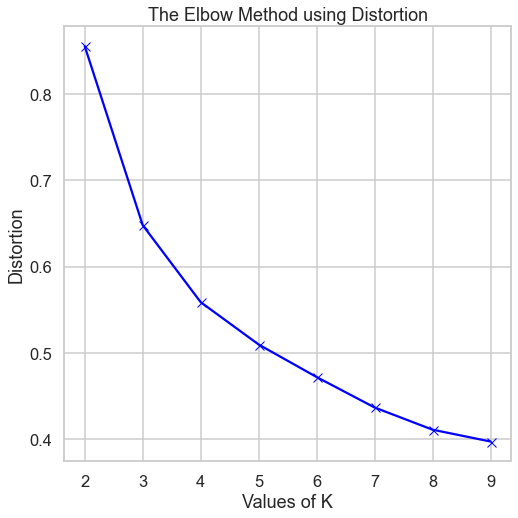

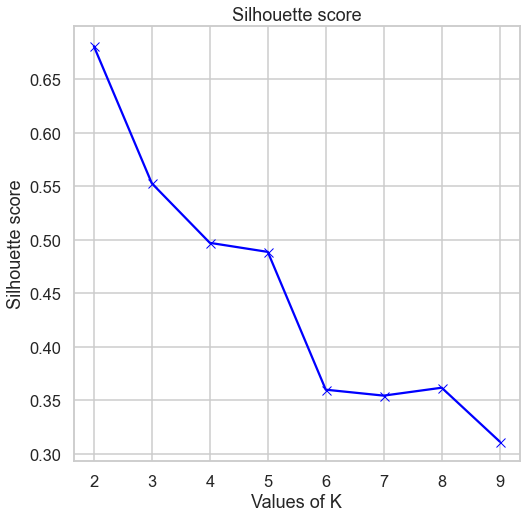

Best K value using Silhouette score :  2


In [687]:
#kmeans
kmeans_help(iris_data.data)

can't apply Silhouette Score , number of clusters is less than 2
can't apply Silhouette Score , number of clusters is less than 2
can't apply Silhouette Score , number of clusters is less than 2
can't apply Silhouette Score , number of clusters is less than 2
can't apply Silhouette Score , number of clusters is less than 2
can't apply Silhouette Score , number of clusters is less than 2
can't apply Silhouette Score , number of clusters is less than 2
can't apply Silhouette Score , number of clusters is less than 2
can't apply Silhouette Score , number of clusters is less than 2
can't apply Silhouette Score , number of clusters is less than 2
can't apply Silhouette Score , number of clusters is less than 2
can't apply Silhouette Score , number of clusters is less than 2
can't apply Silhouette Score , number of clusters is less than 2
can't apply Silhouette Score , number of clusters is less than 2
can't apply Silhouette Score , number of clusters is less than 2
can't apply Silhouette Sc

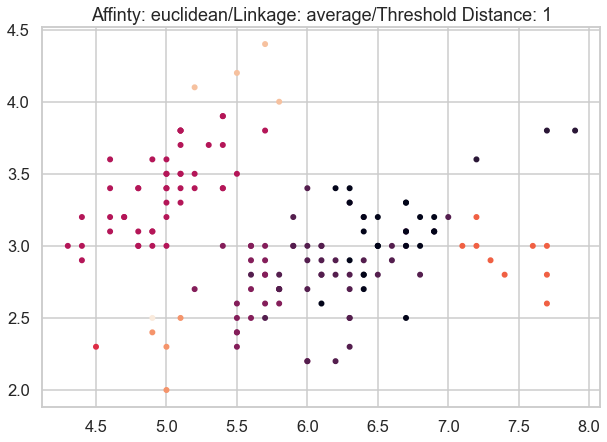

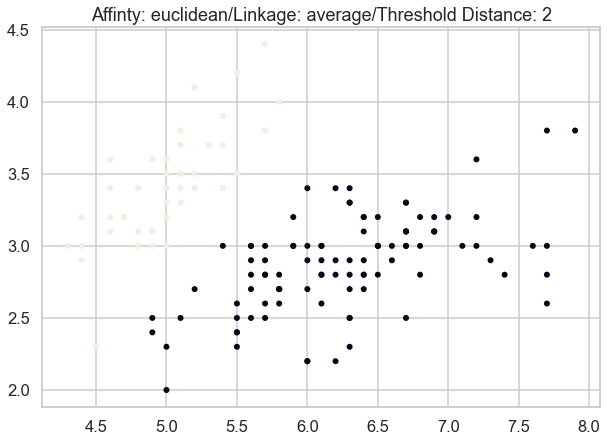

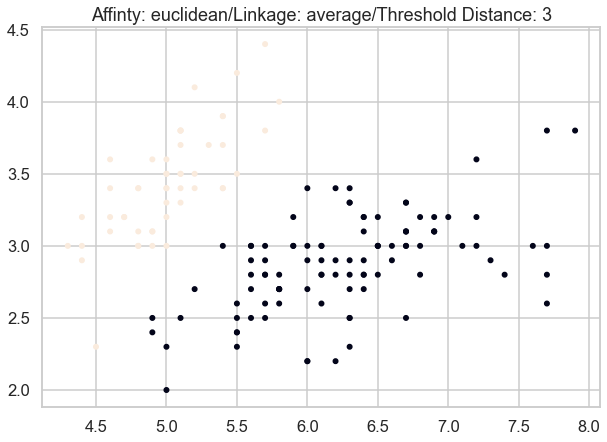

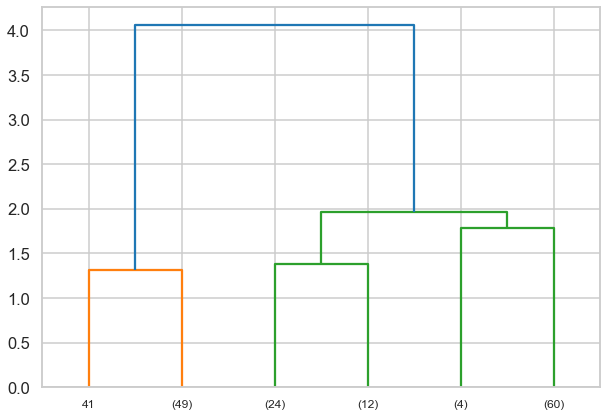

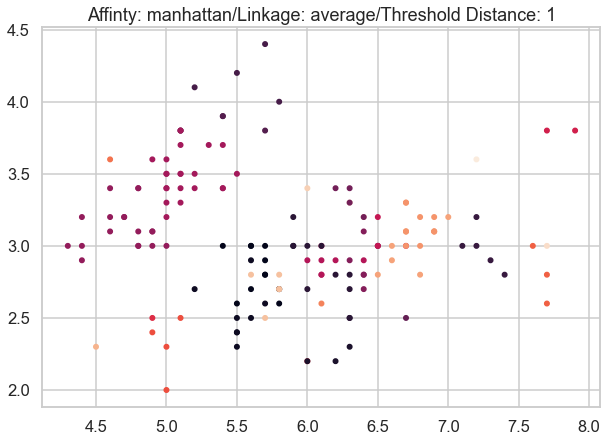

...

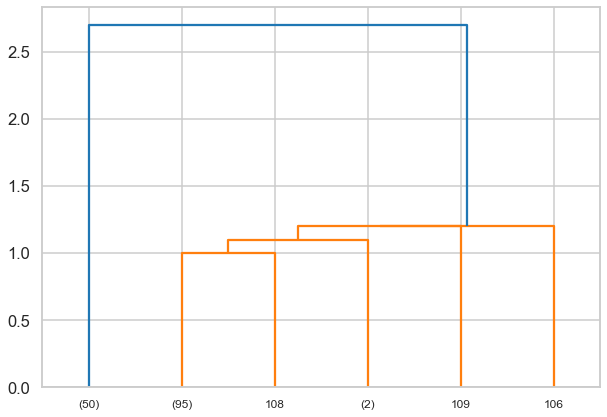

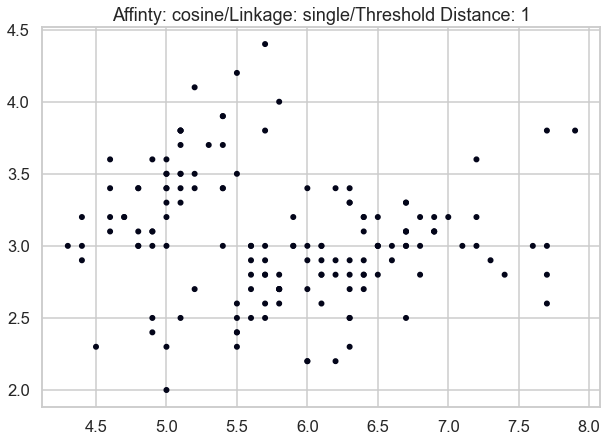

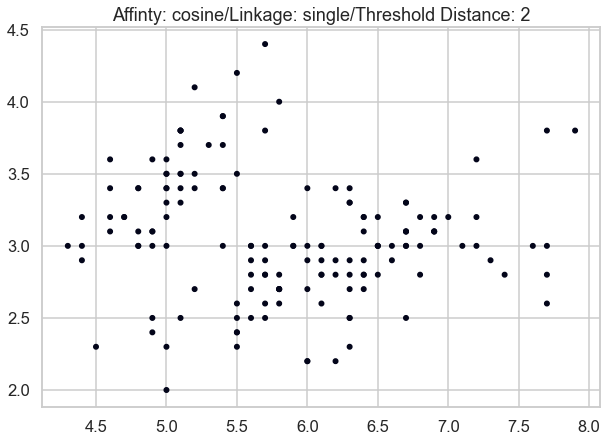

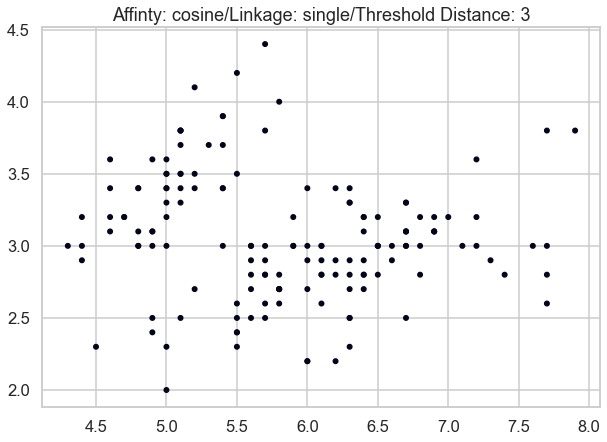

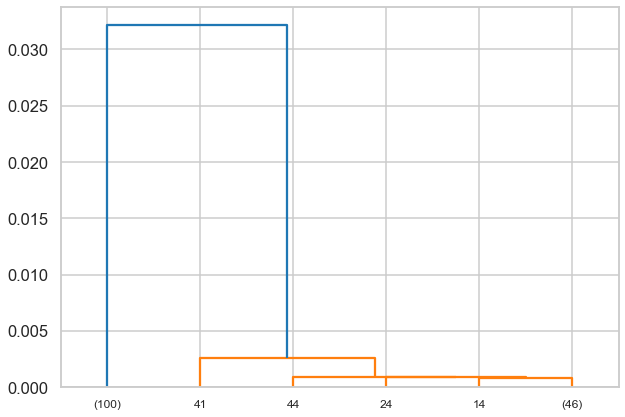

In [688]:
#Hierarchal Clustering
Hierarchal_clustering(iris_data.data)

EPS: 0.1
Min Samples: 5
Can't apply Silhouette Score , number of clusters is less than 2
EPS: 0.2
Min Samples: 5
Silhouette Score: 0.1825642832387
EPS: 0.3
Min Samples: 5
Silhouette Score: -0.0520642964109557
EPS: 0.4
Min Samples: 5
Silhouette Score: 0.2779400139443979
EPS: 0.5
Min Samples: 5
Silhouette Score: 0.48603419703456835
EPS: 0.6
Min Samples: 5
Silhouette Score: 0.5381725940321741
EPS: 0.7
Min Samples: 5
Silhouette Score: 0.501833562046431
EPS: 0.8
Min Samples: 5
Silhouette Score: 0.5121107753649304
EPS: 0.9
Min Samples: 5
Silhouette Score: 0.6867350732769776
EPS: 1.0
Min Samples: 5
Silhouette Score: 0.6867350732769776
EPS: 1.1
Min Samples: 5
Silhouette Score: 0.6867350732769776
EPS: 1.2
Min Samples: 5
Silhouette Score: 0.6867350732769776
EPS: 1.3
Min Samples: 5
Silhouette Score: 0.6867350732769776
EPS: 1.4
Min Samples: 5
Silhouette Score: 0.6867350732769776
EPS: 1.5
Min Samples: 5
Silhouette Score: 0.6867350732769776
EPS: 1.6
Min Samples: 5
Silhouette Score: 0.686735073276977

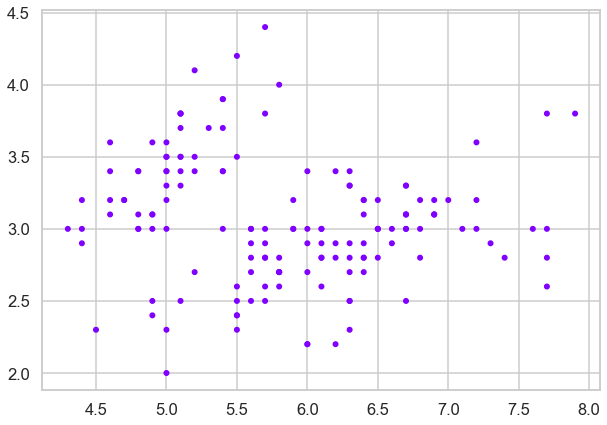

In [689]:
#DBscan
Dbscanhelp(iris_data.data)

In [690]:
#Gaussian Mixture

## Customer dataset
Repeat all the above on the customer data set 

In [691]:
df= pd.read_csv("Customer data.csv")
df.head()

,ID,Sex,Marital status,Age,Education,Income,Occupation,Settlement size
0,100000001,0,0,67,2,124670,1,2
1,100000002,1,1,22,1,150773,1,2
2,100000003,0,0,49,1,89210,0,0
3,100000004,0,0,45,1,171565,1,1
4,100000005,0,0,53,1,149031,1,1


In [692]:
from sklearn import preprocessing

dfcopy=df.iloc[:, [3, 5]].values
scaler = preprocessing.StandardScaler().fit(dfcopy)
dfscaled = scaler.transform(dfcopy)


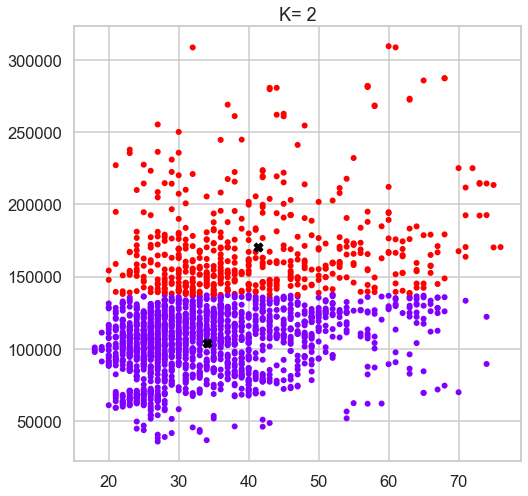

K value=  2
Silhouette score:  0.5834469068936822


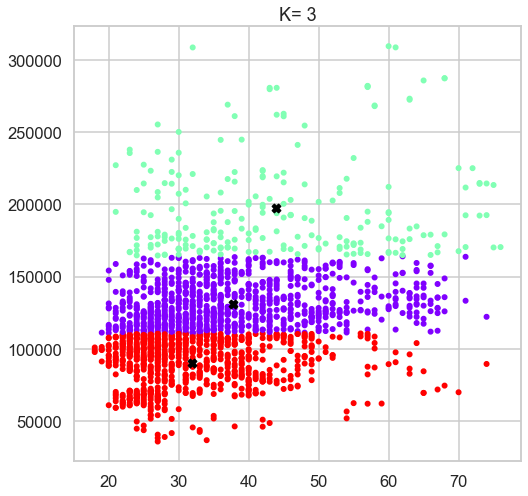

K value=  3
Silhouette score:  0.5116316441491894


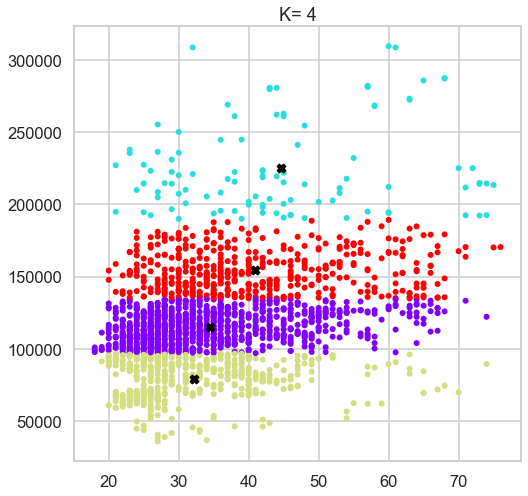

K value=  4
Silhouette score:  0.5429043276490586


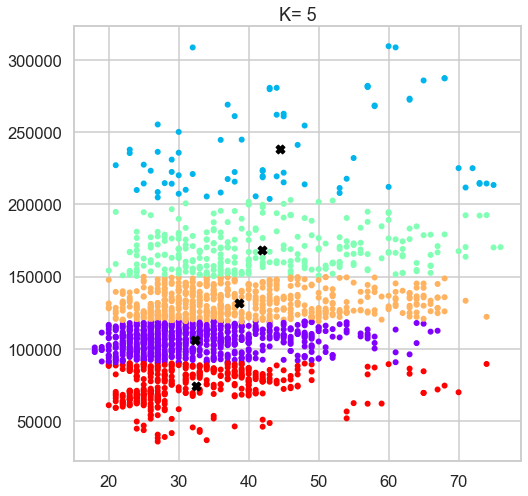

K value=  5
Silhouette score:  0.5401520680025738


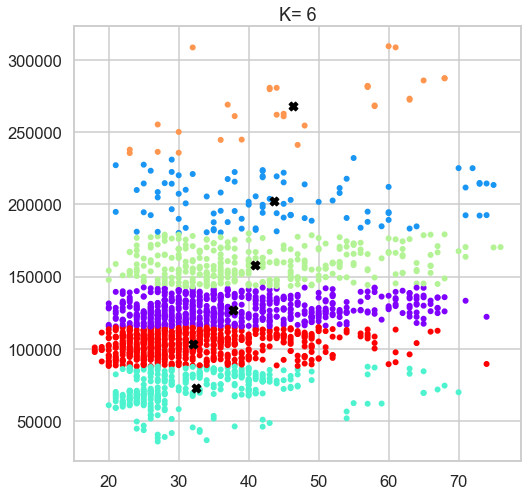

K value=  6
Silhouette score:  0.5410063013959615


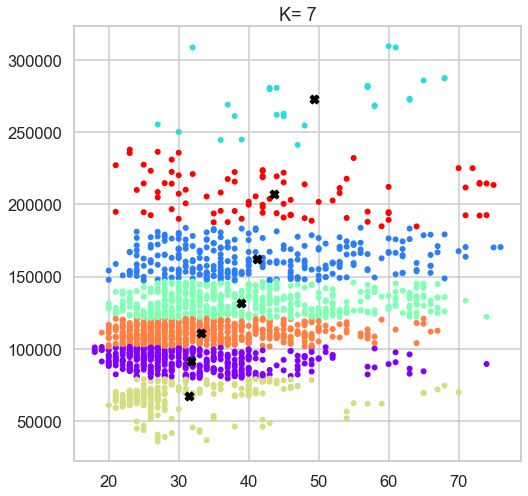

K value=  7
Silhouette score:  0.5339914931561841


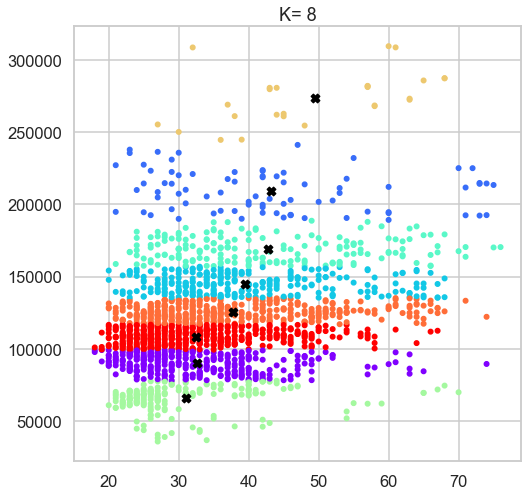

K value=  8
Silhouette score:  0.5404247959591537


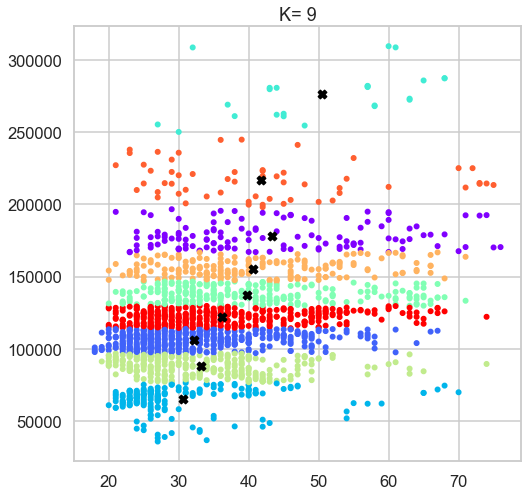

K value=  9
Silhouette score:  0.533770311478606


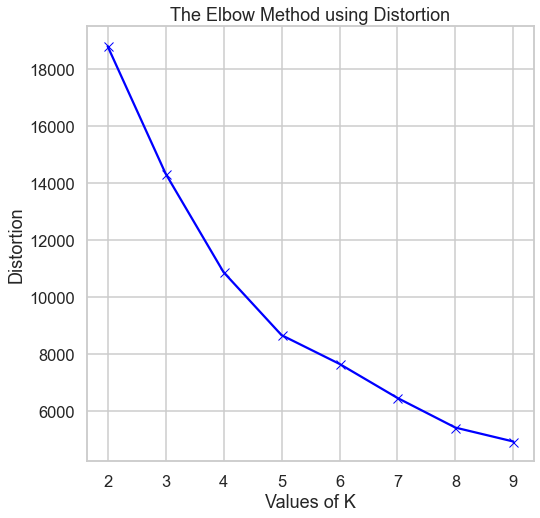

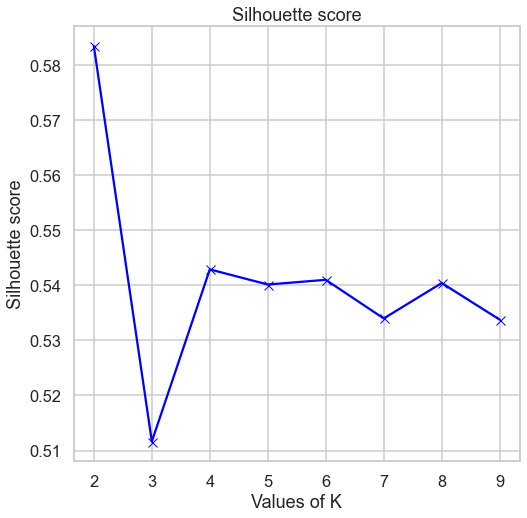

Best K value using Silhouette score :  2


In [693]:
#kmeans
kmeans_help(dfcopy)


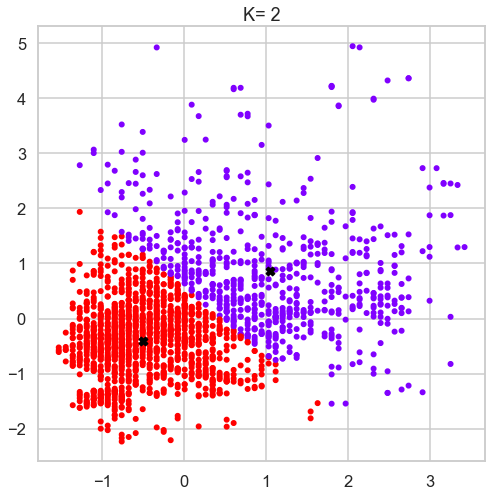

K value=  2
Silhouette score:  0.4426699611651603


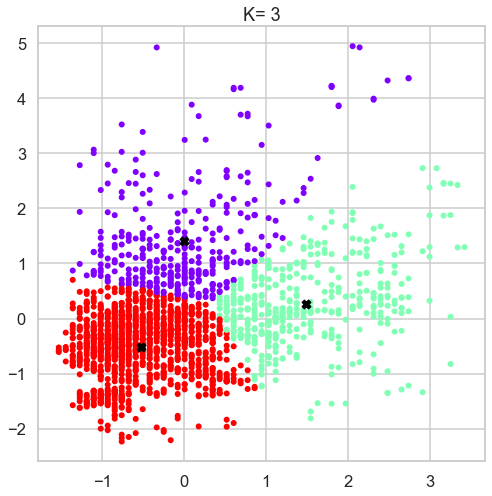

K value=  3
Silhouette score:  0.4386071442006107


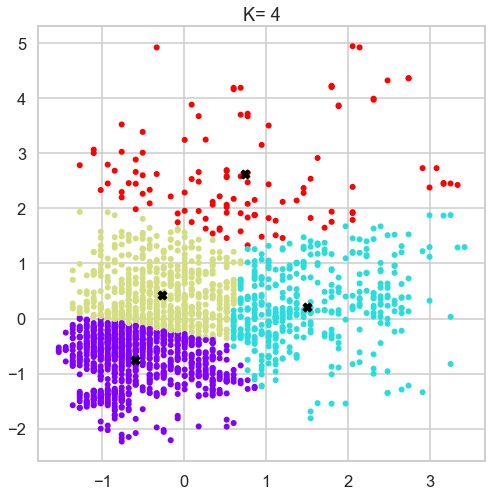

K value=  4
Silhouette score:  0.35034001297824724


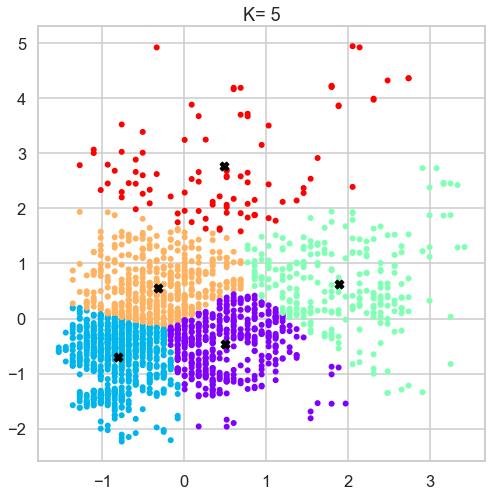

K value=  5
Silhouette score:  0.36488356540717304


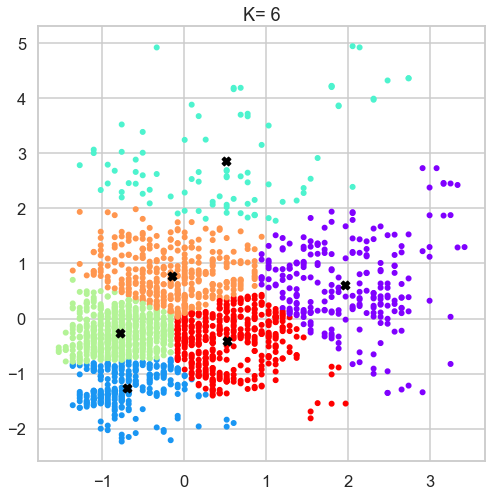

K value=  6
Silhouette score:  0.3556338994461182


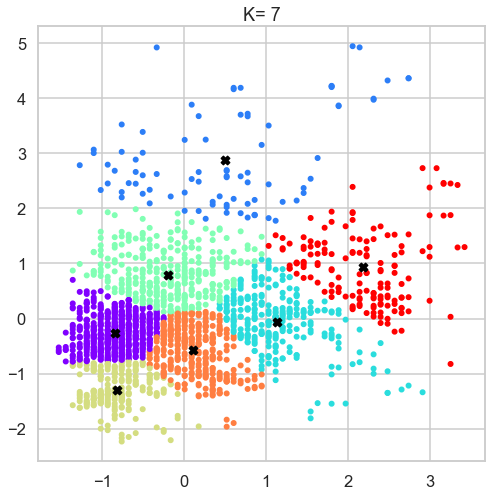

K value=  7
Silhouette score:  0.3576136023917013


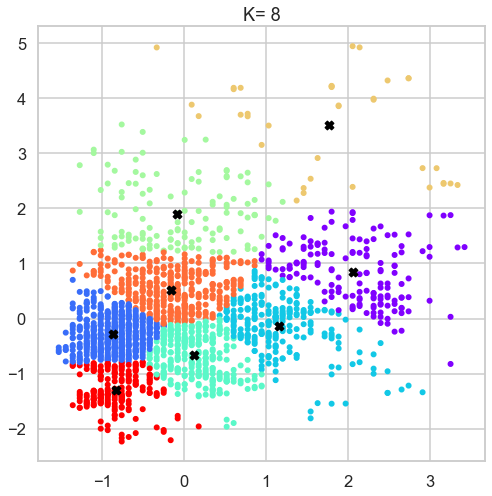

K value=  8
Silhouette score:  0.3559146051465453


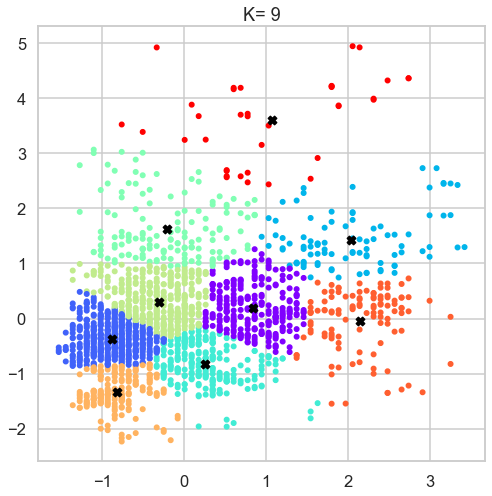

K value=  9
Silhouette score:  0.35474093102605764


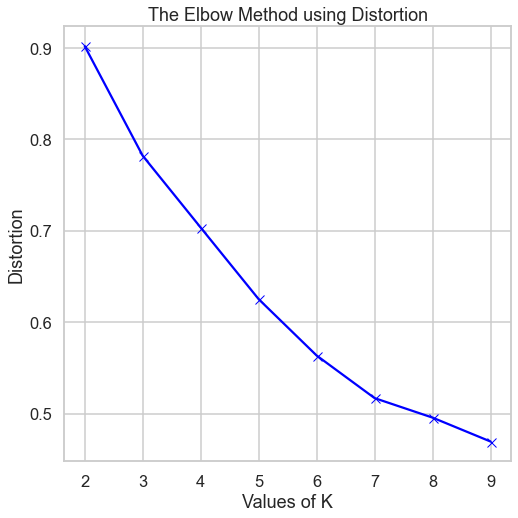

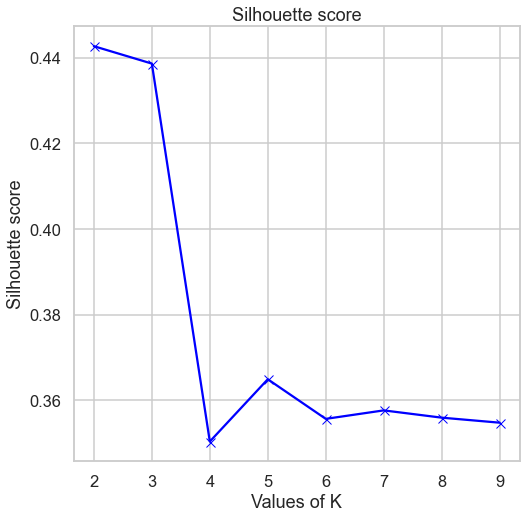

Best K value using Silhouette score :  2


In [694]:
#kkmean after norm
kmeans_help(dfscaled)

can't apply Silhouette Score , number of clusters is less than 2
can't apply Silhouette Score , number of clusters is less than 2
can't apply Silhouette Score , number of clusters is less than 2
can't apply Silhouette Score , number of clusters is less than 2
can't apply Silhouette Score , number of clusters is less than 2
can't apply Silhouette Score , number of clusters is less than 2
can't apply Silhouette Score , number of clusters is less than 2
can't apply Silhouette Score , number of clusters is less than 2
can't apply Silhouette Score , number of clusters is less than 2
can't apply Silhouette Score , number of clusters is less than 2
can't apply Silhouette Score , number of clusters is less than 2
can't apply Silhouette Score , number of clusters is less than 2
can't apply Silhouette Score , number of clusters is less than 2
can't apply Silhouette Score , number of clusters is less than 2
can't apply Silhouette Score , number of clusters is less than 2
can't apply Silhouette Sc

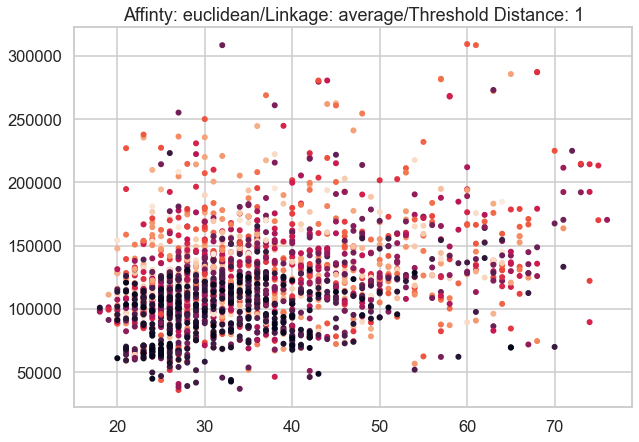

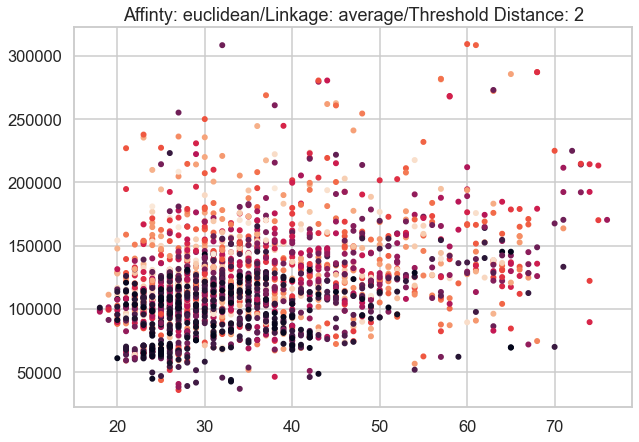

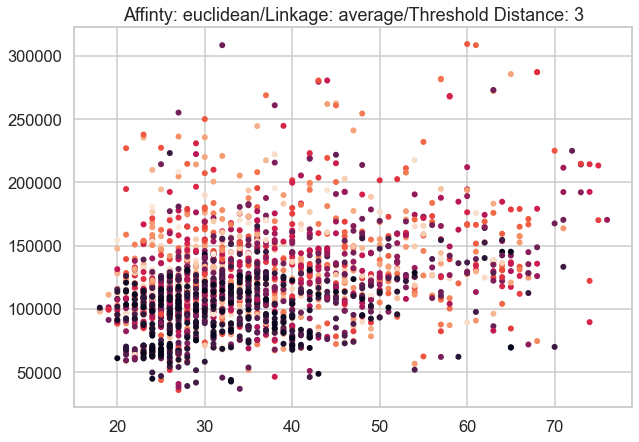

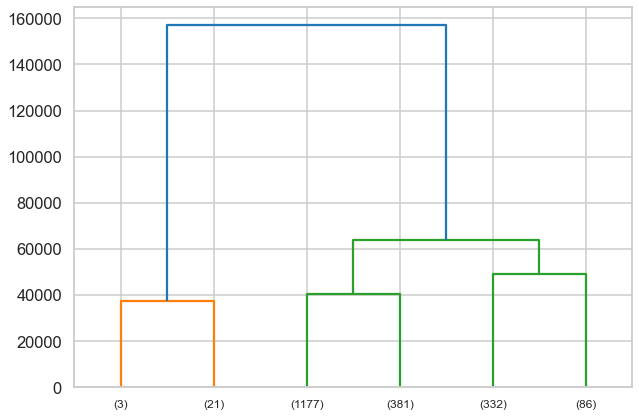

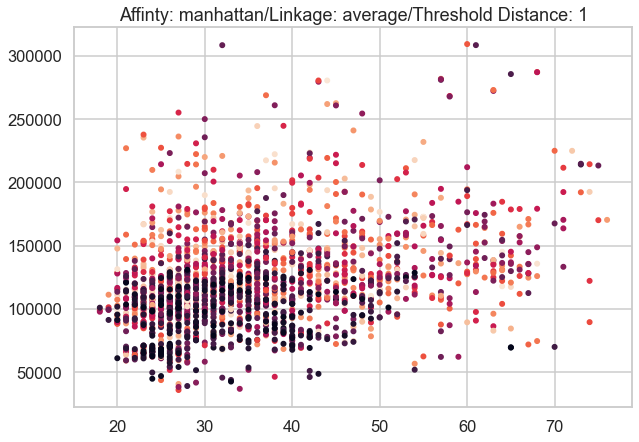

...

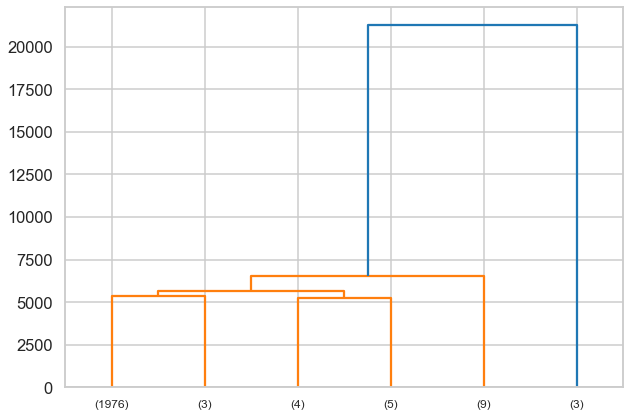

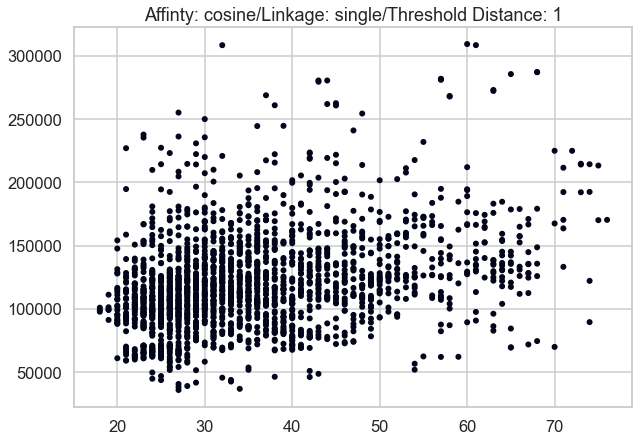

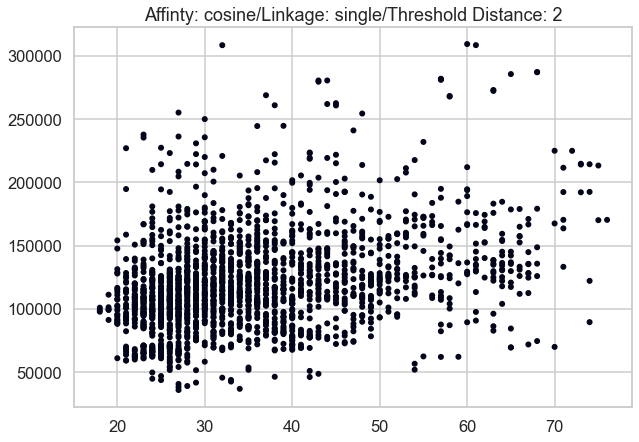

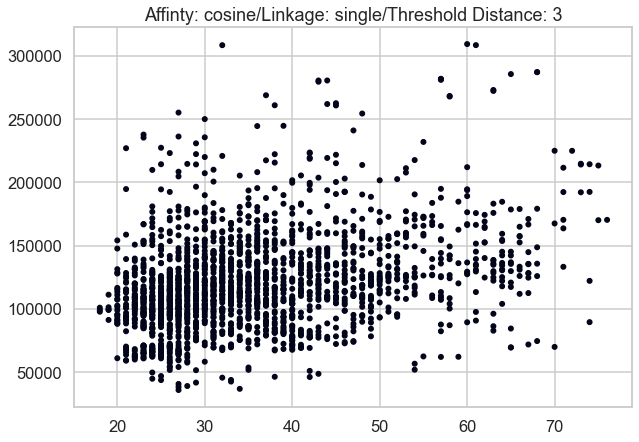

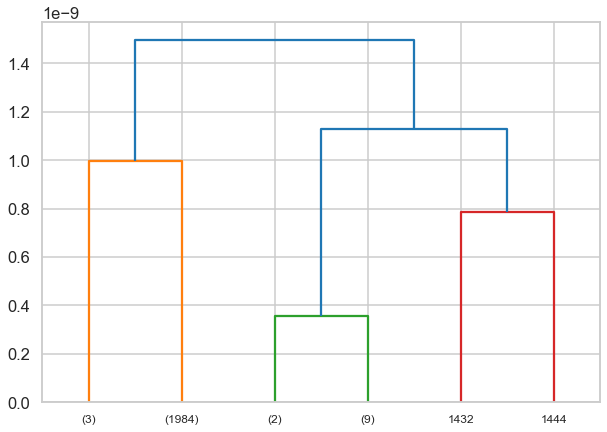

In [695]:
#Hierarchal Clustering
Hierarchal_clustering(dfcopy)

can't apply Silhouette Score , number of clusters is less than 2
can't apply Silhouette Score , number of clusters is less than 2
can't apply Silhouette Score , number of clusters is less than 2
can't apply Silhouette Score , number of clusters is less than 2
can't apply Silhouette Score , number of clusters is less than 2
can't apply Silhouette Score , number of clusters is less than 2
can't apply Silhouette Score , number of clusters is less than 2
can't apply Silhouette Score , number of clusters is less than 2
can't apply Silhouette Score , number of clusters is less than 2
can't apply Silhouette Score , number of clusters is less than 2
can't apply Silhouette Score , number of clusters is less than 2
can't apply Silhouette Score , number of clusters is less than 2
can't apply Silhouette Score , number of clusters is less than 2
can't apply Silhouette Score , number of clusters is less than 2
can't apply Silhouette Score , number of clusters is less than 2
can't apply Silhouette Sc

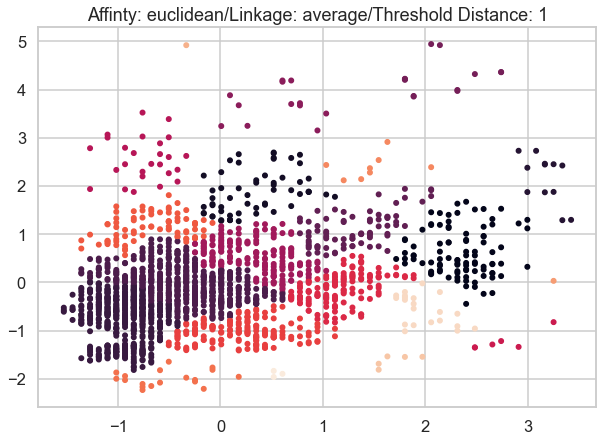

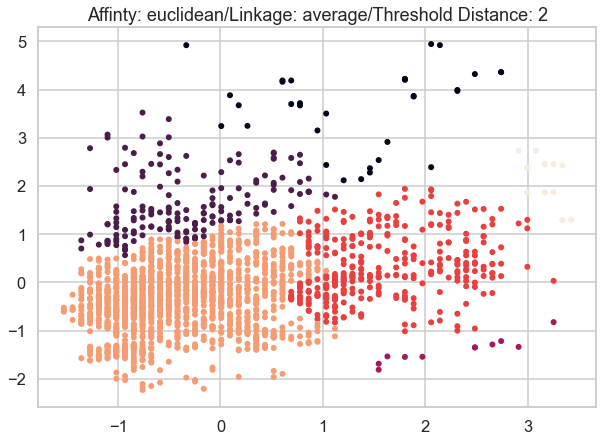

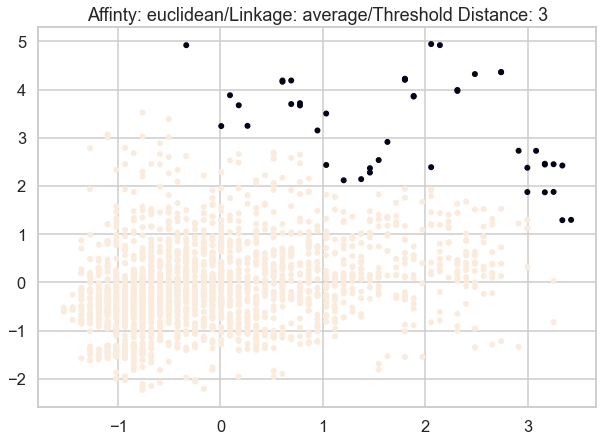

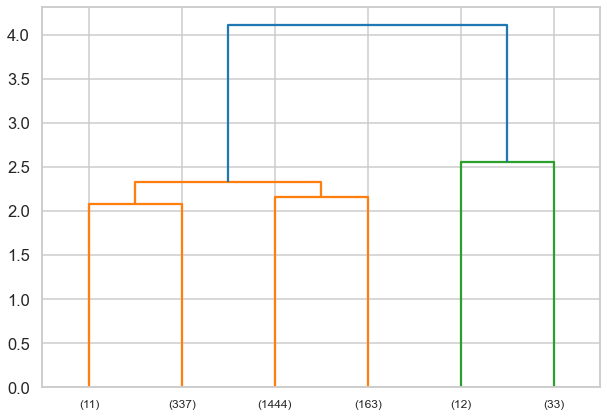

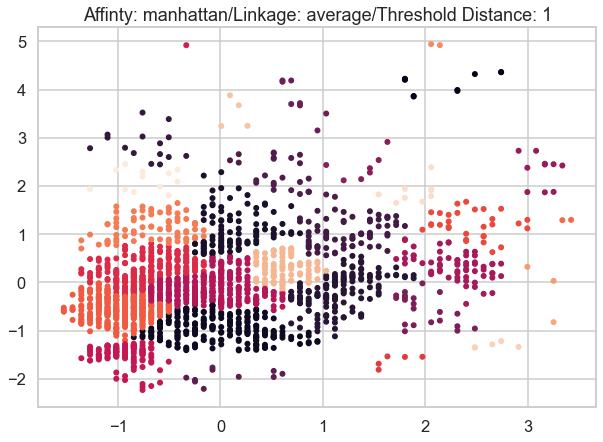

...

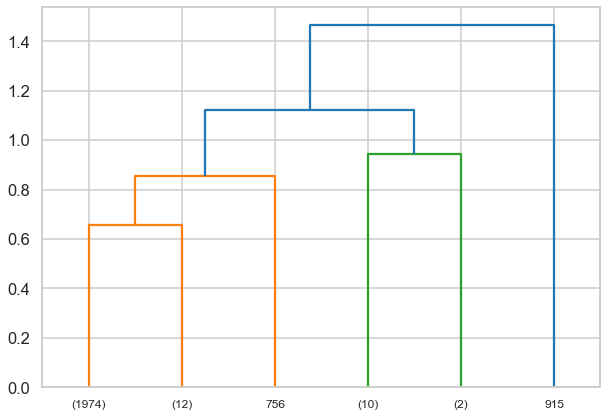

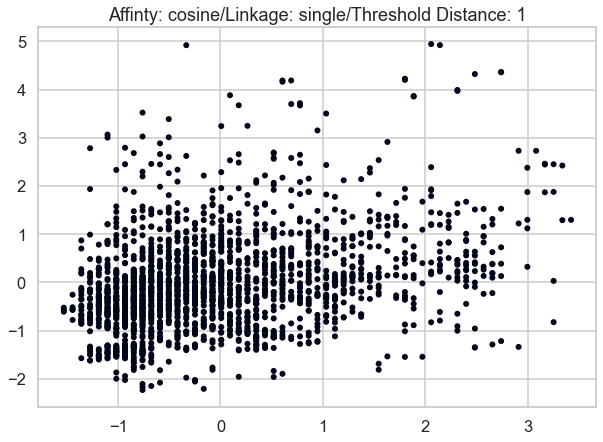

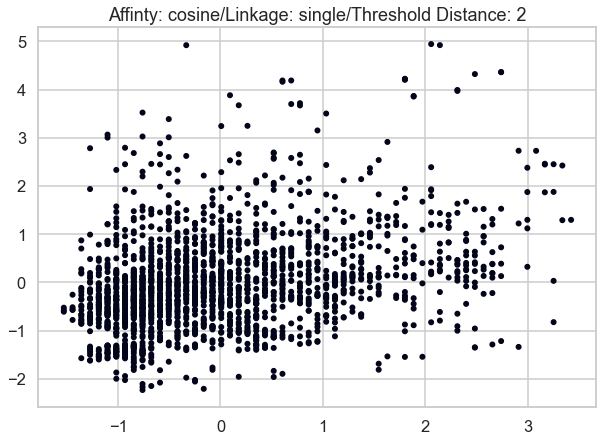

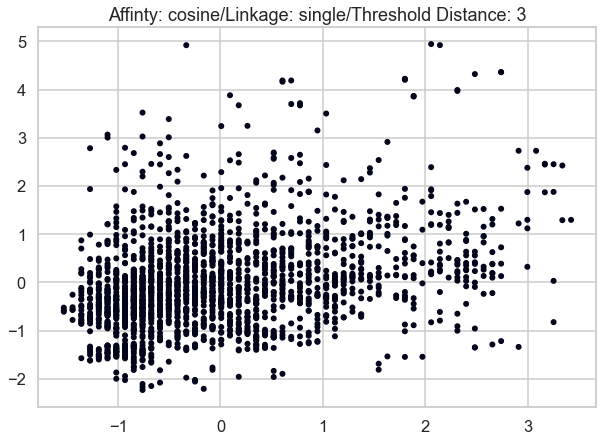

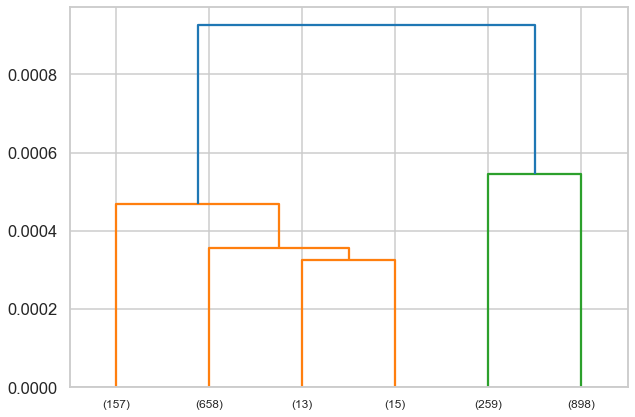

In [696]:
#Hierarchal Clustering after norm
Hierarchal_clustering(dfscaled)

EPS: 0.1
Min Samples: 5
Can't apply Silhouette Score , number of clusters is less than 2
EPS: 0.2
Min Samples: 5
Can't apply Silhouette Score , number of clusters is less than 2
EPS: 0.3
Min Samples: 5
Can't apply Silhouette Score , number of clusters is less than 2
EPS: 0.4
Min Samples: 5
Can't apply Silhouette Score , number of clusters is less than 2
EPS: 0.5
Min Samples: 5
Can't apply Silhouette Score , number of clusters is less than 2
EPS: 0.6
Min Samples: 5
Can't apply Silhouette Score , number of clusters is less than 2
EPS: 0.7
Min Samples: 5
Can't apply Silhouette Score , number of clusters is less than 2
EPS: 0.8
Min Samples: 5
Can't apply Silhouette Score , number of clusters is less than 2
EPS: 0.9
Min Samples: 5
Can't apply Silhouette Score , number of clusters is less than 2
EPS: 1.0
Min Samples: 5
Can't apply Silhouette Score , number of clusters is less than 2
EPS: 1.1
Min Samples: 5
Can't apply Silhouette Score , number of clusters is less than 2
EPS: 1.2
Min Samples:

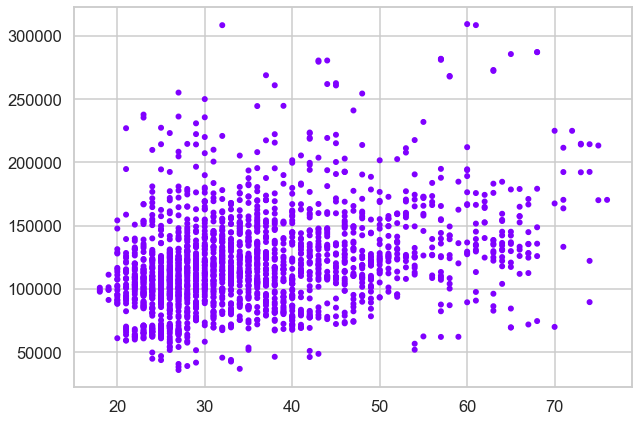

In [697]:
#DBscan
Dbscanhelp(dfcopy)

EPS: 0.1
Min Samples: 5
Silhouette Score: -0.2159281376232853
EPS: 0.2
Min Samples: 5
Silhouette Score: 0.17047902171188087
EPS: 0.3
Min Samples: 5
Silhouette Score: 0.3301719047852043
EPS: 0.4
Min Samples: 5
Silhouette Score: 0.2960997684945662
EPS: 0.5
Min Samples: 5
Silhouette Score: 0.30184126257148797
EPS: 0.6
Min Samples: 5
Silhouette Score: 0.619470137224864
EPS: 0.7
Min Samples: 5
Silhouette Score: 0.6262294456938846
EPS: 0.8
Min Samples: 5
Silhouette Score: 0.6219732314432621
EPS: 0.9
Min Samples: 5
Silhouette Score: 0.6219732314432621
EPS: 1.0
Min Samples: 5
Silhouette Score: 0.6420183561418851
EPS: 1.1
Min Samples: 5
Silhouette Score: 0.6420183561418851
EPS: 1.2
Min Samples: 5
Can't apply Silhouette Score , number of clusters is less than 2
EPS: 1.3
Min Samples: 5
Can't apply Silhouette Score , number of clusters is less than 2
EPS: 1.4
Min Samples: 5
Can't apply Silhouette Score , number of clusters is less than 2
EPS: 1.5
Min Samples: 5
Can't apply Silhouette Score , numbe

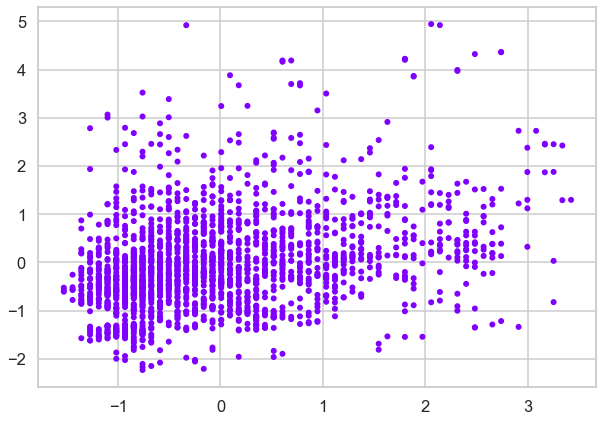

In [698]:
#Dbscan after norm
Dbscanhelp(dfscaled)

In [699]:
#Gaussian Mixture